# Sentinel Hub's Sentinel-2 Cloud Detector

This example notebook shows how to perform cloud classification and cloud masking on Sentinel-2 data.

In the process we will use [`sentinelhub-py`](https://github.com/sentinel-hub/sentinelhub-py) Python package. The package documentation is available [here](https://sentinelhub-py.readthedocs.io/en/latest/).

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import datetime as dt

import matplotlib.pyplot as plt
import numpy as np

from sentinelhub import CRS, BBox, DataCollection, MimeType, SentinelHubRequest, SHConfig, generate_evalscript
from sentinelhub.api.catalog import get_available_timestamps

from s2cloudless import S2PixelCloudDetector, download_bands_and_valid_data_mask

### Sentinel Hub credentials

These examples require Sentinel Hub OAuth client credentials. Please check [`sentinelhub-py` configuration instructions](https://sentinelhub-py.readthedocs.io/en/latest/configure.html#sentinel-hub-capabilities) on how to obtain the credentials and configure them in the package.

In [2]:
# In case you put the credentials into the configuration file you can leave this unchanged
# Paste your own values here:
CLIENT_ID = "a5f25b81-3ef5-4ee9-bce0-5b1fcb33c8d7"
CLIENT_SECRET = "I0f5P4Ono8tB9TEggF3dvzn43NXofkVy"

config = SHConfig()

if CLIENT_ID and CLIENT_SECRET:
    config.sh_client_id = CLIENT_ID
    config.sh_client_secret = CLIENT_SECRET

## Download and calculate cloud masks

We'll demonstrate two key parts:

1. download satellite data
2. calculate cloud masks and probabilities from data

We will first show how to do step 1. with the `sentinelhub-py` package (which gives the user more control). Later we'll introduce some utilities of the `s2cloudless` package for downloading data.


### Example scenes: Acatenango and Volcan Fuego (Guatemala) in December 2017

Acatenango area in Guatemala is well known for its coffee plantations. At the altitute of about 2000 m and given it’s climate, it is often veiled in clouds.

First, lets define the bounding box for the area of interest:

In [3]:
bbox = BBox(((725000, 1595000), (735000, 1610000)), crs=CRS("32615"))

### Download Sentinel-2 data

Let's download data using [Sentinel Hub Process API](https://docs.sentinel-hub.com/api/latest/api/process/). The `s2cloudless` detector only requires `10` out of `13` bands for cloud detection, however in this example we will download all Sentinel-2 bands, to have all RBG bands for visualization.

For simplicity we will request data with reflectance values. To decrease download costs a better option is to download data in digital numbers (i.e. unsigned ints) and then rescale them with normalization factors.

In [4]:
data_collection = DataCollection.SENTINEL2_L1C
evalscript = generate_evalscript(
    data_collection=data_collection,
    meta_bands=["dataMask"],
    merged_bands_output="bands",
    prioritize_dn=False,
)

print(evalscript)


//VERSION=3

function setup() {
    return {
        input: [{
            bands: ["B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B09", "B10", "B11", "B12", "dataMask"],
            units: ["REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "REFLECTANCE", "DN"]
        }],
        output: [{id: "bands", bands: 13, sampleType: "FLOAT32"}, {id: "dataMask", bands: 1, sampleType: "UINT8"}]
    }
}

function updateOutputMetadata(scenes, inputMetadata, outputMetadata) {
    outputMetadata.userData = {
        "norm_factor":  inputMetadata.normalizationFactor
    }
}

function evaluatePixel(sample) {
    return { bands: [sample.B01, sample.B02, sample.B03, sample.B04, sample.B05, sample.B06, sample.B07, sample.B08, sample.B8A, sample.B09, sample.B10, sample.B11, sample.B12], dataMask: [sample.dataMask] };
}



In [5]:
request = SentinelHubRequest(
    evalscript=evalscript,
    input_data=[SentinelHubRequest.input_data(data_collection=data_collection, time_interval="2017-12-01")],
    responses=[
        SentinelHubRequest.output_response("bands", MimeType.TIFF),
        SentinelHubRequest.output_response("dataMask", MimeType.TIFF),
    ],
    bbox=bbox,
    resolution=(10, 10),
    config=config,
)

data = request.get_data()[0]

bands = data["bands.tif"]
mask = data["dataMask.tif"]

bands.shape, mask.shape

((1500, 1000, 13), (1500, 1000))

### Initialize the cloud detector and make classification

We can specify the following arguments in the initialization of a `S2PixelCloudDetector`:

 * `threshold` - cloud probability threshold value. All pixels with cloud probability above threshold value are masked as cloudy pixels. Default is `0.4`.
 * `average_over` - Size of the disk in pixels for performing convolution (averaging probability over pixels). For this resolution `4` is appropriate. 
 * `dilation_size` - Size of the disk in pixels for performing dilation.  For this resolution `2` is appropriate.
 * `all_bands` - Flag specifying that input images will consists of all 13 Sentinel-2 bands. It has to be set to `True` if we would download all bands. If you define a layer that would return only 10 bands, then this parameter should be set to `False`.

In [6]:
cloud_detector = S2PixelCloudDetector(threshold=0.4, average_over=4, dilation_size=2, all_bands=True)

#### Run the classification

There are two possibilities:
 * `get_cloud_probability_maps` will return cloud probability map
 * `get_cloud_masks` will return binary cloud masks

In [7]:
%%time
# The cloud detector works on stacks of images, but we have a single image.
# By using `bands[np.newaxis, ...]` we go from 3D to 4D

cloud_prob = cloud_detector.get_cloud_probability_maps(bands[np.newaxis, ...])

CPU times: user 33 s, sys: 71.9 ms, total: 33.1 s
Wall time: 2.02 s


In [8]:
%%time

cloud_mask = cloud_detector.get_cloud_masks(bands[np.newaxis, ...])

CPU times: user 32.8 s, sys: 21.7 ms, total: 32.8 s
Wall time: 2.02 s


### Visualize the results

We have a binary cloud mask:

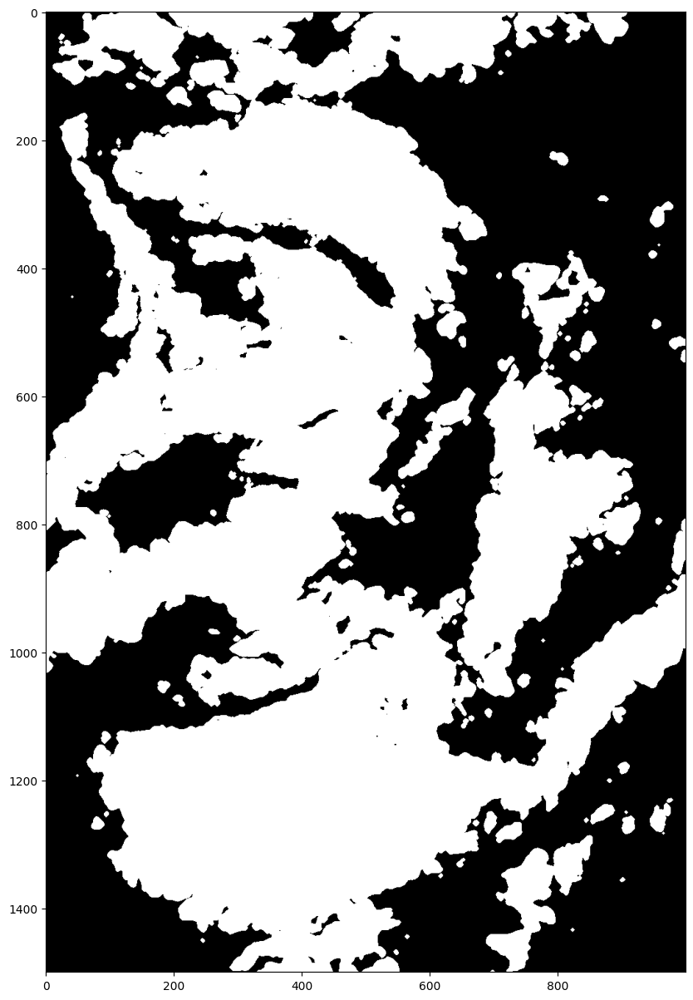

In [9]:
plt.figure(figsize=(15, 15))
plt.imshow(cloud_mask[0], cmap=plt.cm.gray)

Let's plot a true color image overlaid with the cloud mask:

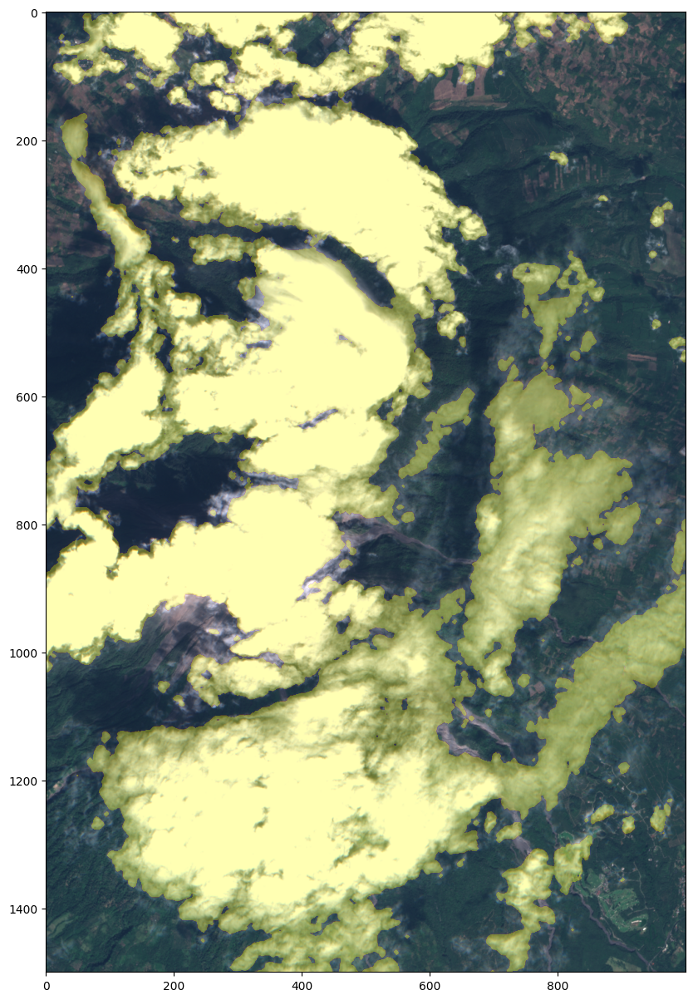

In [10]:
true_color_image = (bands[..., [3, 2, 1]] * 3.5).clip(0, 1)
is_cloud = cloud_mask[0]

_, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
ax.imshow(true_color_image)
ax.imshow(is_cloud, cmap="gnuplot", alpha=0.3 * is_cloud)

Besides that we also have pseudo-probability scores telling us how likely it is that certain pixel is cloudy:

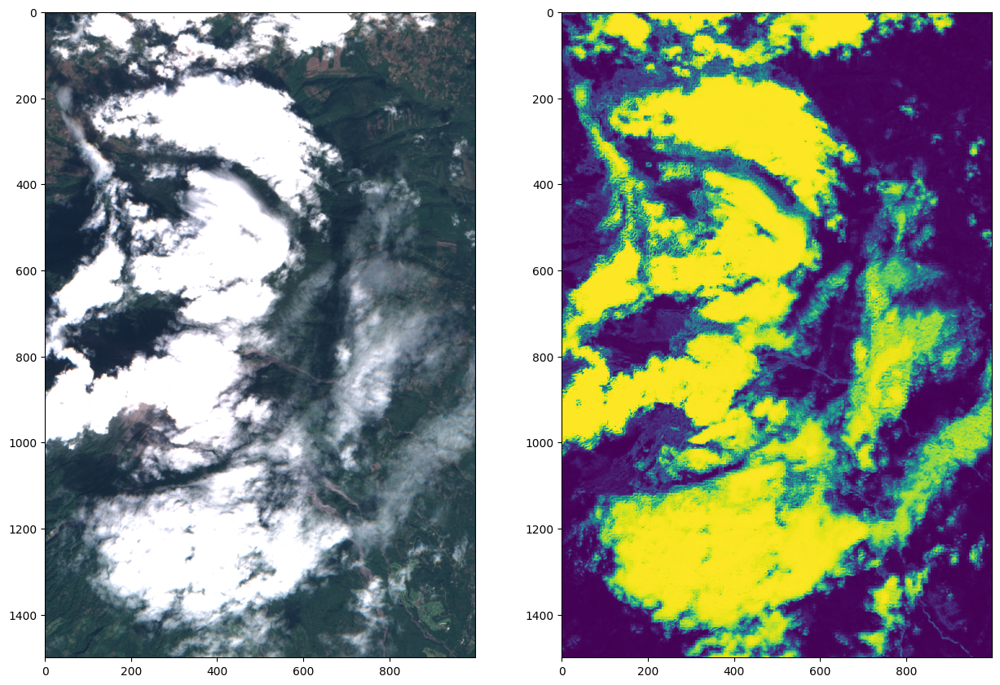

In [11]:
_, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
ax[0].imshow(true_color_image)
ax[1].imshow(cloud_prob[0])

## Another way of use

In this part we show:

1. how to use `get_timestamps` to obtain suitable timestamps for an area in the given time interval
2. introduction to `download_bands_and_valid_data_mask` that makes data acquisition easier
3. experimenting with `threshold` in the `get_mask_from_prob` function 

The utility `get_timestamps` is an interface to [Sentinel Hub Catalog API](https://docs.sentinel-hub.com/api/latest/api/catalog/) and obtains information on when data is available (for the given criteria).

In [12]:
timestamps = get_available_timestamps(
    data_collection=data_collection, bbox=bbox, time_interval=(dt.datetime(2017, 12, 1), dt.datetime(2017, 12, 12)), config=config
)
timestamps

[datetime.datetime(2017, 12, 1, 16, 38, 51),
 datetime.datetime(2017, 12, 6, 16, 32, 21),
 datetime.datetime(2017, 12, 11, 16, 39, 21)]

We download data for all suitable `timestamps`. The function `download_bands_and_valid_data` automates the process, and also uses digital number + normalization behind the scenes to reduce the costs.

In [13]:
bands, masks = download_bands_and_valid_data_mask(bbox=bbox, resolution=(10, 10), timestamps=timestamps, config=config)

We now repeat cloud cloud-mask calculations on the recieved data. This time we calculate the mask directly from probability maps with the `get_mask_from_prob` method.

In [14]:
cloud_detector = S2PixelCloudDetector(threshold=0.4, average_over=1, dilation_size=1, all_bands=True)

probability_maps = cloud_detector.get_cloud_probability_maps(bands)
cloud_mask = cloud_detector.get_mask_from_prob(probability_maps)

Let's extract RGB bands:

In [15]:
true_color_images = np.clip(bands[..., [3, 2, 1]] * 3.5, 0, 1)

Let's plot cloud masks together with images:

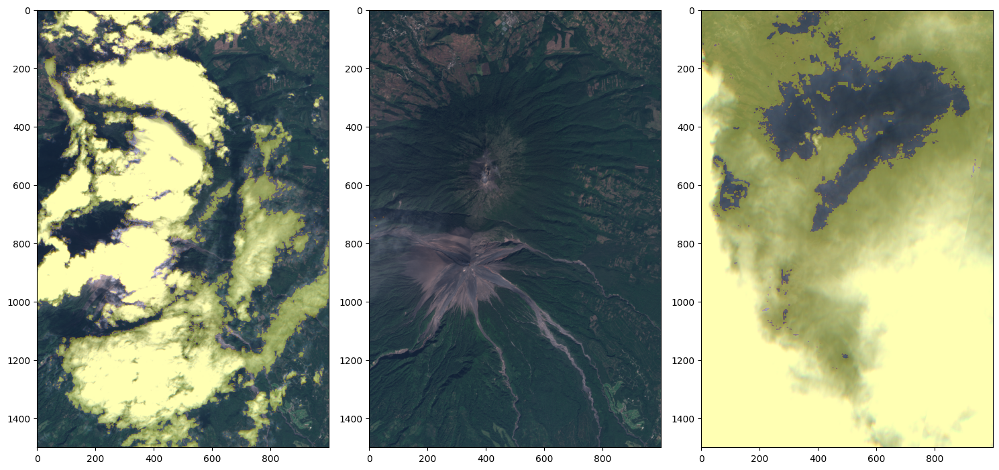

In [16]:
fig = plt.figure(figsize=(15, 10))
n_cols = 3
n_rows = int(np.ceil(len(true_color_images) / n_cols))

for idx, (image, mask) in enumerate(zip(true_color_images, cloud_mask)):
    ax = fig.add_subplot(n_rows, n_cols, idx + 1)
    ax.imshow(image)
    ax.imshow(mask, cmap="gnuplot", alpha=0.3 * (mask > 0))

plt.tight_layout()

If the probability threshold of `0.4` doesn't suit us we can recompute cloud masks with a different threshold. Since we're computing masks from probabilities (and not via ML inference) the process is faster.

In [17]:
cloud_mask_2 = cloud_detector.get_mask_from_prob(probability_maps, threshold=0.2)

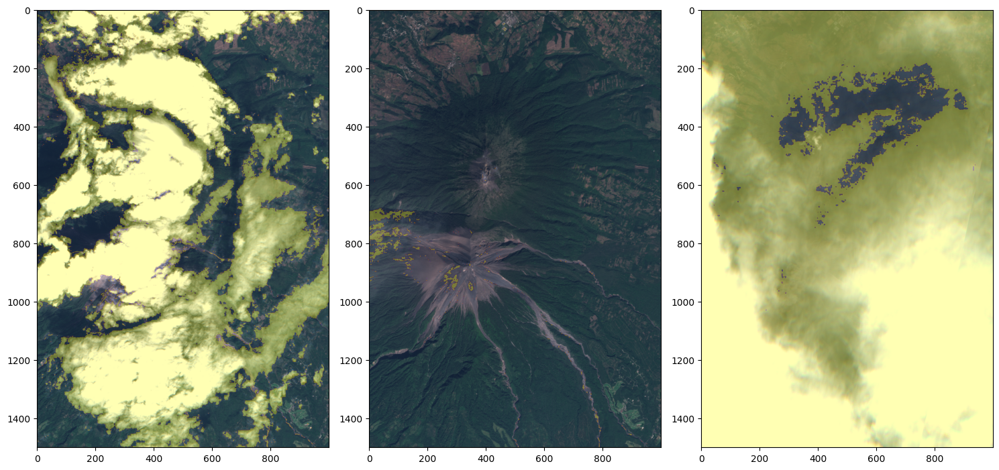

In [18]:
fig = plt.figure(figsize=(15, 10))
n_cols = 3
n_rows = int(np.ceil(len(true_color_images) / n_cols))

for idx, (image, mask) in enumerate(zip(true_color_images, cloud_mask_2)):
    ax = fig.add_subplot(n_rows, n_cols, idx + 1)
    ax.imshow(image)
    ax.imshow(mask, cmap="gnuplot", alpha=0.3 * (mask > 0))

plt.tight_layout()

# Shader-style seperable processing

In [19]:
# --- Minimal dependencies
import numpy as np
import cv2

# Sentinel‑2 band order for 13 bands (L1C/L2A default)
S2_BANDS = ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"]

def _band(img13, name):
    return img13[..., S2_BANDS.index(name)].astype(np.float32)

def _sep_gauss(im, sigma, ksize=None):
    im = np.ascontiguousarray(im.astype(np.float32))
    if ksize is None:
        ksize = int(6*sigma + 1) | 1
    g = cv2.getGaussianKernel(ksize, sigma).astype(np.float32).reshape(-1)
    return cv2.sepFilter2D(im, cv2.CV_32F, g, g)

def _sep_DoG(im, s_small, s_large):
    return _sep_gauss(im, s_small) - _sep_gauss(im, s_large)

def mvp_shader_cloud_mask(one_scene, params=None):
    """
    one_scene: numpy array (H, W, 13) in reflectance [0..1]
    returns: (mask uint8, score float32 in [0..1])
    """
    if params is None:
        params = {
            "sig_pair": (1.0, 3.0),     # small and large sigma in pixels
            "weights": {                # tiny 1x1 mix
                "DoG": 0.6,
                "blue_over_red": 0.4,
                "neg_ndvi": 0.6,
                "neg_ndsi": 0.4,
                "swir_absorb": 0.5
            },
            "threshold": 0.4,          # decision threshold on normalised score
            "close_radius": 1           # morphological closing radius in pixels
        }

    eps = 1e-6
    B02 = _band(one_scene, "B02")  # Blue
    B03 = _band(one_scene, "B03")  # Green
    B04 = _band(one_scene, "B04")  # Red
    B08 = _band(one_scene, "B08")  # NIR
    B11 = _band(one_scene, "B11")  # SWIR1

    # Pointwise spectral cues
    brightness = (B02 + B03 + B04) / 3.0
    ndvi = (B08 - B04) / (B08 + B04 + eps)
    ndsi = (B03 - B11) / (B03 + B11 + eps)
    blue_over_red = B02 / (B04 + eps)
    swir_absorb = 1.0 - (B11 / (np.max(B11) + eps))

    # Separable spatial cue: center–surround on brightness
    s_small, s_large = params["sig_pair"]
    dog = np.clip(_sep_DoG(brightness, s_small, s_large), 0, None)

    # Tiny 1x1 mix (all pointwise)
    w = params["weights"]
    score_raw = (
        w["DoG"] * dog
        + w["blue_over_red"] * blue_over_red
        + w["neg_ndvi"] * (-ndvi)
        + w["neg_ndsi"] * (-ndsi)
        + w["swir_absorb"] * swir_absorb
    )
    # Robust normalisation to [0,1]
    p5, p95 = np.percentile(score_raw, 5), np.percentile(score_raw, 95)
    score = (score_raw - p5) / (p95 - p5 + eps)
    score = np.clip(score, 0.0, 1.0)

    # Threshold and tiny clean up
    mask = (score > params["threshold"]).astype(np.uint8)
    if params["close_radius"] > 0:
        k = cv2.getStructuringElement(cv2.MORPH_RECT, (2*params["close_radius"]+1,)*2)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k)

    return 1-mask, 1-score.astype(np.float32)


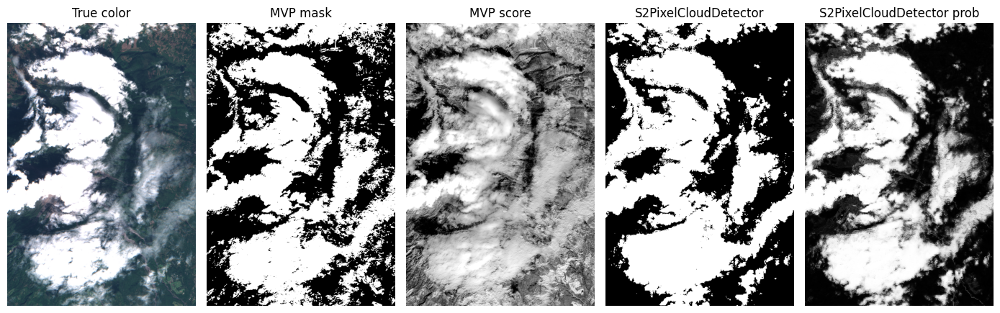

In [20]:
# You said bands has shape (N, H, W, 13)
i = 0
one_scene = bands[i]                    # (H, W, 13)
mask_mvp, score_mvp = mvp_shader_cloud_mask(one_scene)
score_S2 = cloud_detector.get_cloud_probability_maps(bands[np.newaxis, i])
mask_s2 = cloud_detector.get_mask_from_prob(score_S2)

# Visual check
import matplotlib.pyplot as plt
true_color = np.clip(one_scene[..., [3,2,1]] * 3.5, 0, 1)  # B04,B03,B02
plt.figure(figsize=(14,6))
plt.subplot(1,5,1); plt.title("True color"); plt.imshow(true_color); plt.axis("off")
plt.subplot(1,5,2); plt.title("MVP mask"); plt.imshow(mask_mvp, cmap="gray"); plt.axis("off")
plt.subplot(1,5,3); plt.title("MVP score"); plt.imshow(score_mvp, vmin=0, vmax=1, cmap="gray"); plt.axis("off")
plt.subplot(1,5,4); plt.title("S2PixelCloudDetector"); plt.imshow(mask_s2[0], cmap="gray"); plt.axis("off")
plt.subplot(1,5,5); plt.title("S2PixelCloudDetector prob"); plt.imshow(score_S2[0], cmap="gray"); plt.axis("off")
plt.tight_layout()


In [21]:
from sklearn.metrics import precision_recall_fscore_support, jaccard_score

def compare_masks(pred, ref):
    y_pred = pred.astype(bool).ravel()
    y_ref  = ref.astype(bool).ravel()
    iou = jaccard_score(y_ref, y_pred)
    p, r, f1, _ = precision_recall_fscore_support(y_ref, y_pred, average="binary", zero_division=0)
    return {"IoU": iou, "Precision": p, "Recall": r, "F1": f1}

metrics = compare_masks(mask_mvp, cloud_mask[0])
metrics


{'IoU': 0.7221013819995226,
 'Precision': 0.8516168389000699,
 'Recall': 0.8260297873416441,
 'F1': 0.8386281894287716}

In [22]:
import time

t0 = time.perf_counter()
_ = mvp_shader_cloud_mask(one_scene)
t_shader = time.perf_counter() - t0

det = S2PixelCloudDetector(threshold=0.4, average_over=4, dilation_size=2, all_bands=True)
t1 = time.perf_counter()
prob = det.get_cloud_probability_maps(one_scene[np.newaxis, ...])[0]
m_s2 = det.get_mask_from_prob(prob[np.newaxis, ...])[0]
t_s2 = time.perf_counter() - t1

print(f"Shader time: {t_shader:.3f} s, S2‑Cloudless time: {t_s2:.3f} s")


Shader time: 0.090 s, S2‑Cloudless time: 2.022 s


In [42]:
# pick one scene and a cloud mask for it
scene = bands[0]                 # (H, W, 13), reflectance in 0..1
mask  = cloud_mask[0].astype(bool)   # from S2PixelCloudDetector, shape (H, W)
land_mask = 1 - mask

# flatten once, then sample indices
H, W, C = scene.shape
flat = scene.reshape(-1, C)
m = mask.ravel()

idx_cloud = np.flatnonzero(m)
if idx_cloud.size == 0:
    raise ValueError("No cloud pixels.")
k = min(100_000, idx_cloud.size)    # sample up to 100k pixels
sel = np.random.choice(idx_cloud, size=k, replace=False)

cloud_mean = flat[sel].mean(axis=0)
cloud_std  = flat[sel].std(axis=0)


idx_land = np.flatnonzero(land_mask.ravel())
k2 = min(100_000, idx_land.size)
sel2 = np.random.choice(idx_land, size=k2, replace=False) if k2 > 0 else np.array([], dtype=int)

land_mean = flat[sel2].mean(axis=0) if k2 > 0 else None
land_std  = flat[sel2].std(axis=0)  if k2 > 0 else None


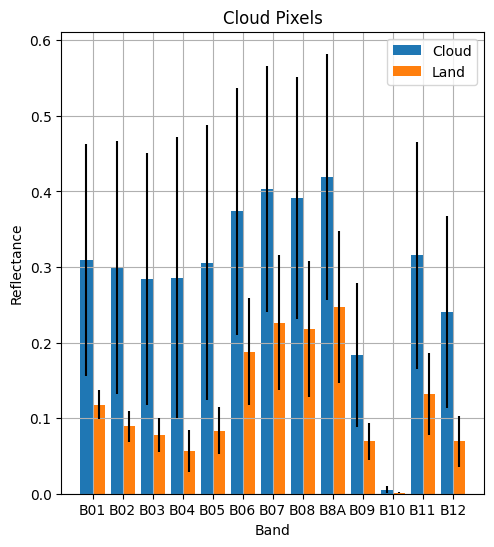

In [43]:
# show cloud mean + std and land mean + std in a plot

plt.figure(figsize=(12, 6))
x = np.arange(C)
plt.subplot(1, 2, 1)
plt.title("Cloud Pixels")
plt.bar(x - 0.2, cloud_mean, 0.4, yerr=cloud_std, label="Cloud", color="C0")
if land_mean is not None:
    plt.bar(x + 0.2, land_mean, 0.4, yerr=land_std, label="Land", color="C1")
plt.xticks(x)
plt.xlabel("Band")
# band names
band_names = [
    "B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B09", "B10", "B11", "B12"
]
plt.xticks(x, band_names)
plt.ylabel("Reflectance")
plt.legend()
plt.grid()


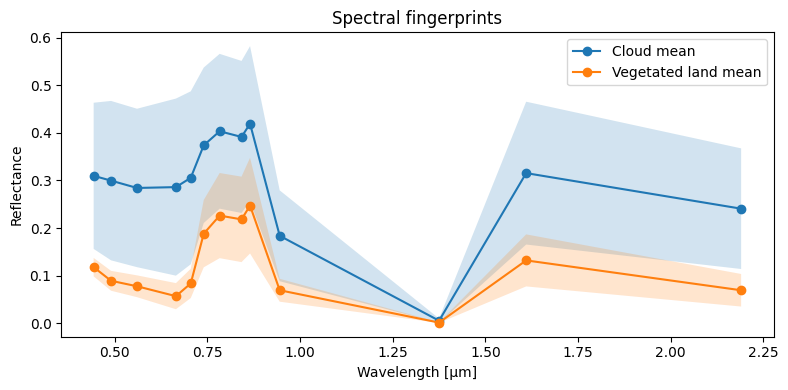

In [47]:
wl = np.array([0.443, 0.490, 0.560, 0.665, 0.705, 0.740, 0.783, 0.842,
               0.865, 0.945, 1.375, 1.610, 2.190])

plt.figure(figsize=(8,4))
plt.title("Spectral fingerprints")
plt.plot(wl, cloud_mean, marker="o", label="Cloud mean")
plt.fill_between(wl, cloud_mean-cloud_std, cloud_mean+cloud_std, alpha=0.2)

if land_mean is not None:
    plt.plot(wl, land_mean, marker="o", label="Vegetated land mean")
    plt.fill_between(wl, land_mean-land_std, land_mean+land_std, alpha=0.2)

plt.xlabel("Wavelength [μm]")
plt.ylabel("Reflectance")
plt.legend()
plt.tight_layout()


Sampled: (4000, 13)


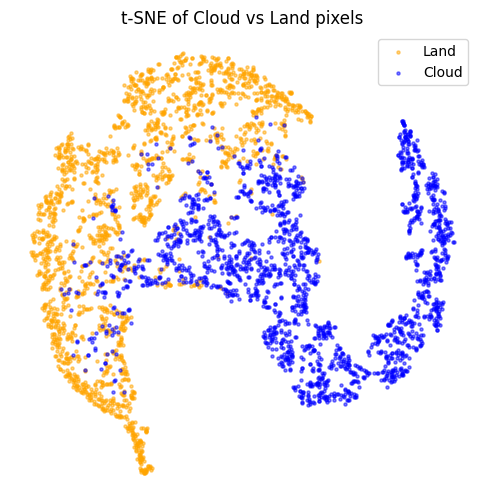

In [48]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# pick scene
scene = bands[0]       # (H, W, 13)
mask  = cloud_mask[0].astype(bool)

# flatten to pixels
H, W, C = scene.shape
flat = scene.reshape(-1, C)
cloud_idx = np.flatnonzero(mask.ravel())
land_idx  = np.flatnonzero(~mask.ravel())

# subsample so t-SNE is fast
n_cloud = min(2000, len(cloud_idx))
n_land  = min(2000, len(land_idx))

sel_cloud = np.random.choice(cloud_idx, n_cloud, replace=False)
sel_land  = np.random.choice(land_idx, n_land, replace=False)

X = np.vstack([flat[sel_cloud], flat[sel_land]])
y = np.array([1]*n_cloud + [0]*n_land)   # 1=cloud, 0=land

print("Sampled:", X.shape)

# run t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
X2d = tsne.fit_transform(X)

# plot
plt.figure(figsize=(6,6))
plt.scatter(X2d[y==0,0], X2d[y==0,1], s=5, c="orange", alpha=0.5, label="Land")
plt.scatter(X2d[y==1,0], X2d[y==1,1], s=5, c="blue",   alpha=0.5, label="Cloud")
plt.legend()
plt.title("t-SNE of Cloud vs Land pixels")
plt.axis("off")
plt.show()


Explained variance ratio: [0.95097315 0.03775675]


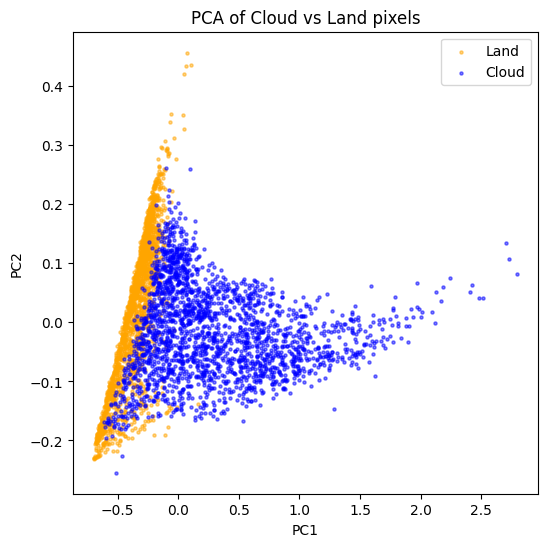

In [50]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# pick scene
scene = bands[0]       # (H, W, 13)
mask  = cloud_mask[0].astype(bool)

# flatten
H, W, C = scene.shape
flat = scene.reshape(-1, C)
labels = mask.ravel().astype(int)  # 1=cloud, 0=land

# subsample for speed
n_samples = 4000
idx = np.random.choice(len(flat), n_samples, replace=False)
X = flat[idx]
y = labels[idx]

# run PCA
pca = PCA(n_components=2)
X2d = pca.fit_transform(X)

print("Explained variance ratio:", pca.explained_variance_ratio_)

# plot
plt.figure(figsize=(6,6))
plt.scatter(X2d[y==0,0], X2d[y==0,1], s=5, c="orange", alpha=0.5, label="Land")
plt.scatter(X2d[y==1,0], X2d[y==1,1], s=5, c="blue",   alpha=0.5, label="Cloud")
plt.legend()
plt.title("PCA of Cloud vs Land pixels")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


Features: ['dog_vis', 'dog_thick', 'dog_cir', 'cirrus', 'thick', 'blue_red', 'neg_ndvi', 'neg_ndsi']
Metrics vs reference: {'IoU': 0.72817837641827, 'Precision': 0.9034947998269743, 'Recall': 0.7895921308822413, 'F1': 0.8427120560638578}
Parameters: 9 weights (including bias)


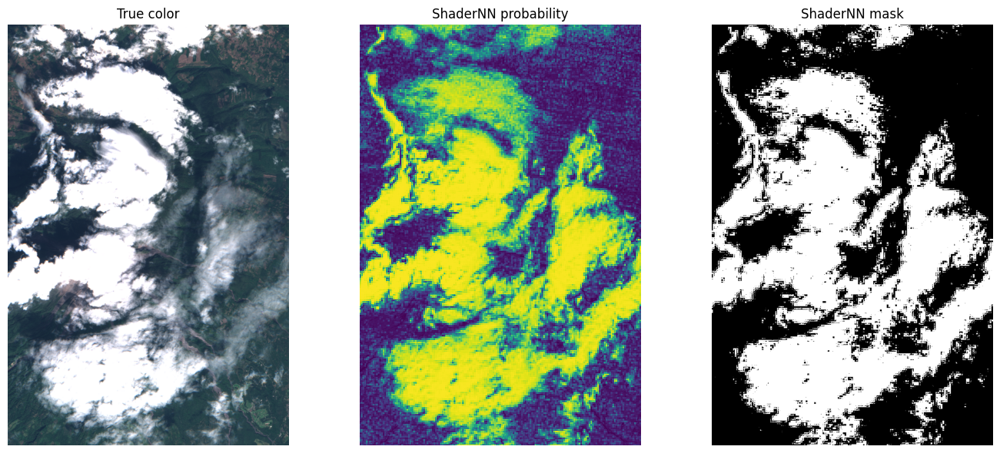

In [65]:
import numpy as np
import cv2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_recall_fscore_support, jaccard_score
import matplotlib.pyplot as plt

# ---------- separable primitives ----------
def gauss1d(sigma: float):
    k = int(6*sigma + 1) | 1
    return cv2.getGaussianKernel(k, sigma).astype(np.float32).reshape(-1)

def sep_filter(img: np.ndarray, kx: np.ndarray, ky: np.ndarray):
    img32 = np.ascontiguousarray(img.astype(np.float32))
    return cv2.sepFilter2D(img32, cv2.CV_32F, kx, ky)

def sep_gauss(img: np.ndarray, sigma: float):
    g = gauss1d(sigma)
    return sep_filter(img, g, g)

def sep_box_mean(img: np.ndarray, radius: int):
    k = 2*radius + 1
    kern = (np.ones(k, np.float32) / k).reshape(-1)
    return sep_filter(img, kern, kern)

def divisive_norm(img: np.ndarray, radius: int = 7, eps: float = 1e-3):
    mu = sep_box_mean(img, radius)
    return img / (mu + eps)

def DoG(img: np.ndarray, s_small: float, s_large: float):
    return sep_gauss(img, s_small) - sep_gauss(img, s_large)

def norm01(x):
    p5, p95 = np.percentile(x, [5, 95])
    return np.clip((x - p5) / (p95 - p5 + 1e-6), 0, 1)

# Sentinel‑2 band names in 13‑band order
S2 = ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"]
def B(scene, name): return scene[..., S2.index(name)].astype(np.float32)

# ---------- feature builder, all separable or pointwise ----------
def build_separable_features(scene13,
                             norm_r=7,
                             sig_vis=(16.0, 26.0),
                             sig_thk=(24.0, 40.0),
                             sig_cir=(6.0, 12.0)):
    # bands
    B02 = B(scene13, "B02"); B03 = B(scene13, "B03"); B04 = B(scene13, "B04")
    B08 = B(scene13, "B08"); B10 = B(scene13, "B10"); B11 = B(scene13, "B11")

    # local photometric normalisation
    B02n = divisive_norm(B02, norm_r); B03n = divisive_norm(B03, norm_r); B04n = divisive_norm(B04, norm_r)
    B08n = divisive_norm(B08, norm_r); B10n = divisive_norm(B10, norm_r); B11n = divisive_norm(B11, norm_r)

    # spectral pointwise cues
    ndvi = (B08n - B04n) / (B08n + B04n + 1e-6)
    ndsi = (B03n - B11n) / (B03n + B11n + 1e-6)
    blue_red = np.clip(B02n / (B04n + 1e-6), 0, 5)
    cirrus = norm01(B10n)
    thick = 1.0 - norm01(B11n)  # SWIR absorption proxy

    # spatial cues from whiteness and thickness
    Yvis = (B02n + B03n + B04n) / 3.0
    whiteness = np.maximum.reduce([B02n, B03n, B04n]) - Yvis
    dog_vis   = np.clip(DoG(whiteness, *sig_vis), 0, None)
    dog_thick = np.clip(DoG(thick,     *sig_thk), 0, None)
    dog_cir   = np.clip(DoG(B10n,      *sig_cir), 0, None)

    # normalise spatial energies
    dog_vis_n   = norm01(dog_vis)
    dog_thick_n = norm01(dog_thick)
    dog_cir_n   = norm01(dog_cir)

    # stack features (keep K small and meaningful)
    feats = [
        dog_vis_n, dog_thick_n, dog_cir_n,          # spatial energies
        cirrus, thick,                               # spectral confirmations
        blue_red,                                    # haze or thin cloud hint
        np.clip(-ndvi, 0, 1),                        # vegetation veto
        np.clip(-ndsi, 0, 1)                         # snow or ice veto
    ]
    F = np.stack(feats, axis=-1).astype(np.float32)  # H x W x K
    names = ["dog_vis","dog_thick","dog_cir","cirrus","thick","blue_red","neg_ndvi","neg_ndsi"]
    return F, names

# ---------- tiny learner on one image ----------
def train_tiny_logreg_on_one(F, ref_mask, max_pos=8000, max_neg=8000):
    H, W, K = F.shape
    X = F.reshape(-1, K)
    y = ref_mask.astype(np.uint8).ravel()

    pos_idx = np.flatnonzero(y == 1)
    neg_idx = np.flatnonzero(y == 0)
    if pos_idx.size == 0 or neg_idx.size == 0:
        raise ValueError("Reference mask has only one class")

    npos = min(max_pos, pos_idx.size)
    nneg = min(max_neg, neg_idx.size)

    sel = np.concatenate([
        np.random.choice(pos_idx, npos, replace=False),
        np.random.choice(neg_idx, nneg, replace=False)
    ])
    np.random.shuffle(sel)

    Xs = X[sel]
    ys = y[sel]

    # standardise features from sample mean and std, keep for inference
    mu = Xs.mean(axis=0)
    sd = Xs.std(axis=0) + 1e-6
    Xs_z = (Xs - mu) / sd

    clf = LogisticRegression(
        penalty="l2",
        C=1.0,
        class_weight="balanced",
        solver="lbfgs",
        max_iter=400,
        n_jobs=None
    )
    clf.fit(Xs_z, ys)

    model = {
        "w": clf.coef_.reshape(-1),
        "b": float(clf.intercept_[0]),
        "mu": mu,
        "sd": sd
    }
    return model

def sigmoid(z): return 1.0 / (1.0 + np.exp(-z))

def infer_shadernn(F, model):
    X = F.reshape(-1, F.shape[-1])
    Xz = (X - model["mu"]) / model["sd"]
    z = Xz.dot(model["w"]) + model["b"]
    p = sigmoid(z).astype(np.float32)
    prob = p.reshape(F.shape[:2])
    return prob

# ---------- evaluation helpers ----------
def compare_masks(pred, ref):
    y_pred = pred.astype(bool).ravel()
    y_ref  = ref.astype(bool).ravel()
    iou = jaccard_score(y_ref, y_pred)
    p, r, f1, _ = precision_recall_fscore_support(y_ref, y_pred, average="binary", zero_division=0)
    return {"IoU": iou, "Precision": p, "Recall": r, "F1": f1}

# ---------- run the demo on one scene ----------
scene = bands[0]                       # (H, W, 13)
# pick a reference, either S2‑Cloudless or SCL based
# if you already computed S2 cloud mask:
ref = cloud_mask[0].astype(np.uint8)

F, feat_names = build_separable_features(scene)
model = train_tiny_logreg_on_one(F, ref)

prob = infer_shadernn(F, model)

# simple threshold, or tilewise bounded Otsu if you prefer
thr = 0.6
pred = (prob > thr).astype(np.uint8)

# metrics
metrics = compare_masks(pred, ref)
print("Features:", feat_names)
print("Metrics vs reference:", metrics)
print("Parameters:", F.shape[-1] + 1, "weights (including bias)")

# visuals
tc = np.clip(scene[..., [3,2,1]] * 3.5, 0, 1)
plt.figure(figsize=(14,6))
plt.subplot(1,3,1); plt.title("True color"); plt.imshow(tc); plt.axis("off")
plt.subplot(1,3,2); plt.title("ShaderNN probability"); plt.imshow(prob, vmin=0, vmax=1); plt.axis("off")
plt.subplot(1,3,3); plt.title("ShaderNN mask"); plt.imshow(pred, cmap="gray"); plt.axis("off")
plt.tight_layout()


Features: ['dog_vis', 'dog_thick', 'dog_cir', 'cirrus', 'thick', 'blue_red', 'neg_ndvi', 'neg_ndsi']
Metrics vs reference: {'IoU': 0.0002380351693399299, 'Precision': 0.00023803991943702847, 'Recall': 0.9226519337016574, 'F1': 0.0004759570441642536}
Parameters: 9 weights (including bias)


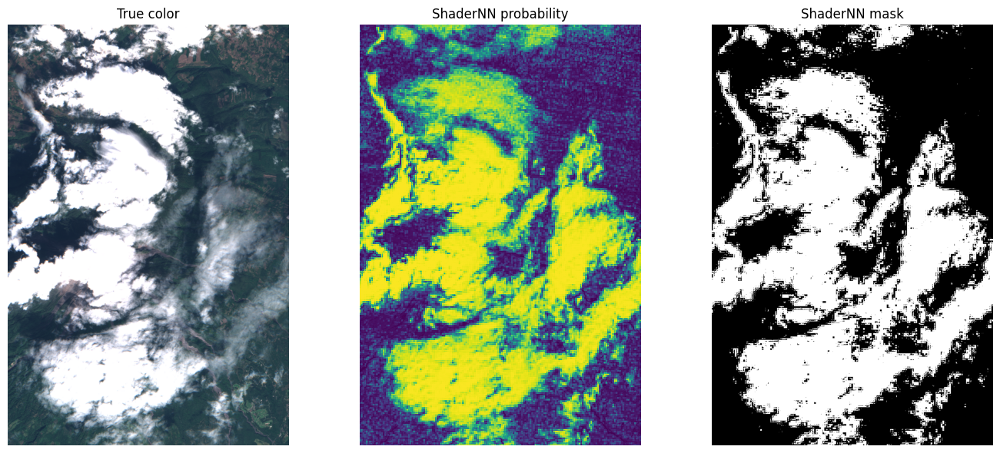

In [63]:
# test model on bands[1]

test_scene = bands[0]
F_test, feat_names = build_separable_features(test_scene)
prob_test = infer_shadernn(F_test, model)

# simple threshold, or tilewise bounded Otsu if you prefer
thr = 0.6
pred_test = (prob_test > thr).astype(np.uint8)

ref_test = cloud_mask[1].astype(np.uint8)
metrics = compare_masks(pred_test, ref_test)

print("Features:", feat_names)
print("Metrics vs reference:", metrics)
print("Parameters:", F.shape[-1] + 1, "weights (including bias)")

# visuals
tc_test = np.clip(test_scene[..., [3,2,1]] * 3.5, 0, 1)
plt.figure(figsize=(14,6))
plt.subplot(1,3,1); plt.title("True color"); plt.imshow(tc_test); plt.axis("off")
plt.subplot(1,3,2); plt.title("ShaderNN probability"); plt.imshow(prob_test, vmin=0, vmax=1); plt.axis("off")
plt.subplot(1,3,3); plt.title("ShaderNN mask"); plt.imshow(pred_test, cmap="gray"); plt.axis("off")
plt.tight_layout()

In [70]:
import numpy as np
import cv2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_recall_fscore_support, jaccard_score

# ---------- Separable primitives ----------
def gauss1d(sigma):
    k = int(6*sigma + 1) | 1
    return cv2.getGaussianKernel(k, sigma).astype(np.float32).reshape(-1)

def sep_filter(img, kx, ky):
    img32 = np.ascontiguousarray(img.astype(np.float32))
    return cv2.sepFilter2D(img32, cv2.CV_32F, kx, ky)

def sep_gauss(img, sigma):
    g = gauss1d(sigma)
    return sep_filter(img, g, g)

def sep_box_mean(img, radius):
    k = 2*radius + 1
    kern = (np.ones(k, np.float32) / k).reshape(-1)
    return sep_filter(img, kern, kern)

def divisive_norm(img, radius=7, eps=1e-3):
    mu = sep_box_mean(img, radius)
    return img / (mu + eps)

def DoG(img, s1, s2):
    return sep_gauss(img, s1) - sep_gauss(img, s2)

def norm01(x):
    p5, p95 = np.percentile(x, [5, 95])
    return np.clip((x - p5) / (p95 - p5 + 1e-6), 0, 1)

S2 = ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"]
def B(scene, name): return scene[..., S2.index(name)].astype(np.float32)

# ---------- Build per-pixel spectral vectors with local normalisation ----------
def build_spectral_vectors(scene13, norm_r=7):
    H, W, C = scene13.shape
    X = np.empty_like(scene13, dtype=np.float32)
    for i in range(C):
        X[..., i] = divisive_norm(scene13[..., i].astype(np.float32), norm_r)
    return X  # H W 13

# ---------- Learn spectral projector on scene A ----------
def learn_spectral_projector(X13, ref_mask, max_pos=20000, max_neg=20000):
    H, W, C = X13.shape
    X = X13.reshape(-1, C)
    y = ref_mask.astype(np.uint8).ravel()
    pos = np.flatnonzero(y == 1); neg = np.flatnonzero(y == 0)
    npos = min(max_pos, pos.size); nneg = min(max_neg, neg.size)
    sel = np.concatenate([np.random.choice(pos, npos, replace=False),
                          np.random.choice(neg, nneg, replace=False)])
    np.random.shuffle(sel)
    Xs = X[sel]; ys = y[sel]
    mu = Xs.mean(axis=0); sd = Xs.std(axis=0) + 1e-6
    Xs_z = (Xs - mu) / sd
    clf = LogisticRegression(penalty="l2", C=1.0, class_weight="balanced",
                             solver="lbfgs", max_iter=400)
    clf.fit(Xs_z, ys)
    return {"w": clf.coef_.reshape(-1).astype(np.float32),
            "b": float(clf.intercept_[0]),
            "mu": mu.astype(np.float32),
            "sd": sd.astype(np.float32)}

def spectral_projection_map(X13, model):
    H, W, C = X13.shape
    X = X13.reshape(-1, C)
    Xz = (X - model["mu"]) / model["sd"]
    z = Xz.dot(model["w"]) + model["b"]
    return z.reshape(H, W).astype(np.float32)

# ---------- Spatial energy on the projector map (separable) ----------
def spatial_energy_on_projection(P, sig_pairs=((16.0, 26.0), (32.0, 52.0))):
    E = np.zeros_like(P, dtype=np.float32)
    for s1, s2 in sig_pairs:
        E = np.maximum(E, np.clip(DoG(P, s1, s2), 0, None))
    return norm01(E)

# ---------- Learn tiny mixer on scene A ----------
def learn_tiny_mixer(P, Esp, ref_mask, max_pos=20000, max_neg=20000):
    f1 = norm01(P); f2 = Esp
    feats = np.stack([f1, f2], axis=-1).reshape(-1, 2)
    y = ref_mask.astype(np.uint8).ravel()
    pos = np.flatnonzero(y == 1); neg = np.flatnonzero(y == 0)
    npos = min(max_pos, pos.size); nneg = min(max_neg, neg.size)
    sel = np.concatenate([np.random.choice(pos, npos, replace=False),
                          np.random.choice(neg, nneg, replace=False)])
    np.random.shuffle(sel)
    Xs = feats[sel]; ys = y[sel]
    mu = Xs.mean(axis=0); sd = Xs.std(axis=0) + 1e-6
    Xs_z = (Xs - mu) / sd
    clf = LogisticRegression(penalty="l2", C=1.0, class_weight="balanced",
                             solver="lbfgs", max_iter=400)
    clf.fit(Xs_z, ys)
    return {"w": clf.coef_.reshape(-1).astype(np.float32),
            "b": float(clf.intercept_[0]),
            "mu": mu.astype(np.float32),
            "sd": sd.astype(np.float32)}

def mixer_probability(P, Esp, model):
    f1 = norm01(P); f2 = Esp
    X = np.stack([f1, f2], axis=-1).reshape(-1, 2)
    Xz = (X - model["mu"]) / model["sd"]
    z = Xz.dot(model["w"]) + model["b"]
    prob = (1.0 / (1.0 + np.exp(-z))).astype(np.float32)
    return prob.reshape(P.shape)

# ---------- Thresholding ----------
def refined_threshold(prob, tile=64, thr_global=0.45, thr_band=(0.2, 0.8)):
    H, W = prob.shape
    mask = (prob > thr_global).astype(np.uint8)  # keep confident structure
    # refine only tiles near the boundary
    boundary = (prob > thr_global - 0.1) & (prob < thr_global + 0.1)
    for y in range(0, H, tile):
        for x in range(0, W, tile):
            t = prob[y:y+tile, x:x+tile]
            b = boundary[y:y+tile, x:x+tile]
            if t.size == 0 or b.sum() == 0:
                continue
            tv, _ = cv2.threshold((t[b]*255).astype(np.uint8), 0, 255,
                                   cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            thr = float(np.clip(tv/255.0, thr_band[0], thr_band[1]))
            mask[y:y+tile, x:x+tile] = ((prob[y:y+tile, x:x+tile] > thr) |
                                        mask[y:y+tile, x:x+tile]).astype(np.uint8)
    k = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k)
    return mask

# ---------- Metrics ----------
def compare_masks(pred, ref):
    y_pred = pred.astype(bool).ravel()
    y_ref  = ref.astype(bool).ravel()
    iou = jaccard_score(y_ref, y_pred)
    p, r, f1, _ = precision_recall_fscore_support(y_ref, y_pred, average="binary", zero_division=0)
    return {"IoU": float(iou), "Precision": float(p), "Recall": float(r), "F1": float(f1)}

# ---------- Train on scene A, test on scene B ----------
def train_on_A_test_on_B(scene_A, ref_A, scene_B, ref_B=None,
                         sig_pairs=((16.0, 26.0), (32.0, 52.0)), norm_r=7):
    # train
    X_A = build_spectral_vectors(scene_A, norm_r=norm_r)
    spec_A = learn_spectral_projector(X_A, ref_A)
    P_A = spectral_projection_map(X_A, spec_A)
    Esp_A = spatial_energy_on_projection(P_A, sig_pairs=sig_pairs)
    mix_A = learn_tiny_mixer(P_A, Esp_A, ref_A)

    # test
    X_B = build_spectral_vectors(scene_B, norm_r=norm_r)
    P_B = spectral_projection_map(X_B, spec_A)      # reuse spectral projector
    Esp_B = spatial_energy_on_projection(P_B, sig_pairs=sig_pairs)
    prob_B = mixer_probability(P_B, Esp_B, mix_A)   # reuse mixer
    pred_B = refined_threshold(prob_B)

    metrics = None
    if ref_B is not None:
        metrics = compare_masks(pred_B, ref_B)

    return {"prob": prob_B, "mask": pred_B, "P": P_B, "Esp": Esp_B,
            "spec_model": spec_A, "mix_model": mix_A, "metrics": metrics}


Test metrics vs reference: {'IoU': 0.7737054743788297, 'Precision': 0.873191663985774, 'Recall': 0.8716438667914127, 'F1': 0.87241707888373}


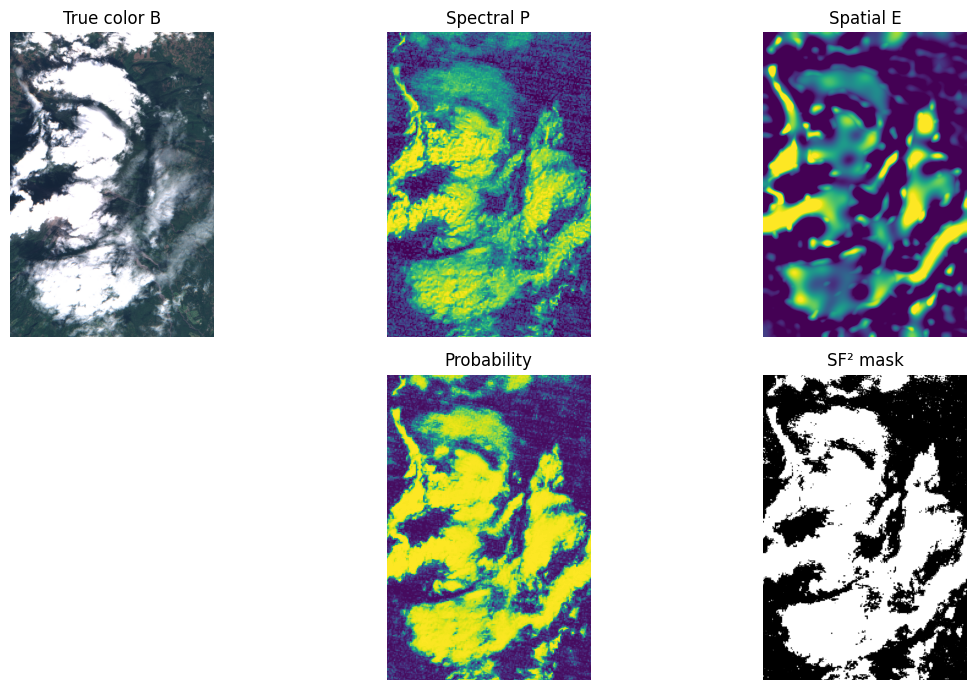

In [73]:
# scenes
scene_A = bands[0]                  # train
scene_B = bands[0]                  # test

# references (choose what you have)
# If you already computed S2PixelCloudDetector masks:
ref_A = cloud_mask[0].astype(np.uint8)
ref_B = cloud_mask[0].astype(np.uint8)

out = train_on_A_test_on_B(scene_A, ref_A, scene_B, ref_B)

print("Test metrics vs reference:", out["metrics"])
import matplotlib.pyplot as plt
tcB = np.clip(scene_B[..., [3,2,1]] * 3.5, 0, 1)
plt.figure(figsize=(12,7))
plt.subplot(2,3,1); plt.title("True color B"); plt.imshow(tcB); plt.axis("off")
plt.subplot(2,3,2); plt.title("Spectral P");   plt.imshow(norm01(out["P"]), vmin=0, vmax=1); plt.axis("off")
plt.subplot(2,3,3); plt.title("Spatial E");    plt.imshow(out["Esp"], vmin=0, vmax=1); plt.axis("off")
plt.subplot(2,3,5); plt.title("Probability");  plt.imshow(out["prob"], vmin=0, vmax=1); plt.axis("off")
plt.subplot(2,3,6); plt.title("SF² mask");     plt.imshow(out["mask"], cmap="gray"); plt.axis("off")
plt.tight_layout()


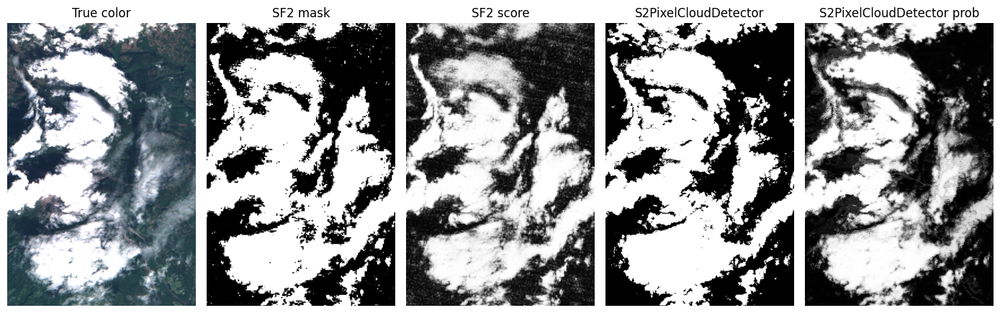

In [75]:
# Visual check
import matplotlib.pyplot as plt
true_color = np.clip(one_scene[..., [3,2,1]] * 3.5, 0, 1)  # B04,B03,B02
plt.figure(figsize=(14,6))
plt.subplot(1,5,1); plt.title("True color"); plt.imshow(true_color); plt.axis("off")
plt.subplot(1,5,2); plt.title("SF2 mask"); plt.imshow(out["mask"], cmap="gray"); plt.axis("off")
plt.subplot(1,5,3); plt.title("SF2 score"); plt.imshow(out["prob"], vmin=0, vmax=1, cmap="gray"); plt.axis("off")
plt.subplot(1,5,4); plt.title("S2PixelCloudDetector"); plt.imshow(mask_s2[0], cmap="gray"); plt.axis("off")
plt.subplot(1,5,5); plt.title("S2PixelCloudDetector prob"); plt.imshow(score_S2[0], cmap="gray"); plt.axis("off")
plt.tight_layout()

In [ ]:
import numpy as np
import cv2

def _gaussian_kernels_1d(sigma, radius=None):
    """
    Return 1D 0th, 1st, and 2nd derivative of Gaussian kernels for a given sigma.
    Shapes are (2*radius+1, 1). Suited for cv2.sepFilter2D.
    """
    if sigma <= 0:
        raise ValueError("sigma must be positive")
    if radius is None:
        # cover about 3 sigmas on each side
        radius = int(np.ceil(3.0 * sigma))
    x = np.arange(-radius, radius + 1, dtype=np.float32).reshape(-1, 1)
    s2 = sigma * sigma
    g0 = np.exp(-0.5 * (x * x) / s2)
    g0 /= g0.sum()

    # first and second derivatives of Gaussian
    g1 = (-x / s2) * g0
    # zero-mean for numerical stability
    g1 -= g1.mean()

    g2 = ((x * x - s2) / (s2 * s2)) * g0
    # enforce zero-sum of second derivative kernel
    g2 -= g2.mean()

    return g0.astype(np.float32), g1.astype(np.float32), g2.astype(np.float32)

def _local_energy(field, win_radius=3, use_gaussian=False, sigma=2.0):
    """
    Smooth a field with a small separable window to get local energy.
    """
    if use_gaussian:
        kx = cv2.getGaussianKernel(ksize=2*int(np.ceil(3*sigma))+1, sigma=sigma)
        ky = kx
        return cv2.sepFilter2D(field, ddepth=cv2.CV_32F, kernelX=kx, kernelY=ky, borderType=cv2.BORDER_REPLICATE)
    else:
        k = 2 * win_radius + 1
        return cv2.boxFilter(field, ddepth=cv2.CV_32F, ksize=(k, k), normalize=True, borderType=cv2.BORDER_REPLICATE)

def local_frequency_map(
    L,
    sigma_x=1.2,
    sigma_y=1.6,
    win_radius=3,
    eps=1e-6,
    blur_is_gaussian=False,
    blur_sigma=2.0,
    clip_to_nyquist=True
):
    """
    Estimate a per-pixel local spatial frequency map from a single-band image L.

    Parameters
    ----------
    L : np.ndarray, float32 or float64
        2D array with values in any range. Convert to float before calling.
    sigma_x, sigma_y : float
        Derivative scale across track and along track. Use a single value for isotropic grids.
    win_radius : int
        Radius for the local energy window if box smoothing is used.
    eps : float
        Small constant for numerical stability.
    blur_is_gaussian : bool
        If True use a Gaussian window for local energy. Otherwise use a box window.
    blur_sigma : float
        Sigma of the Gaussian window if blur_is_gaussian is True.
    clip_to_nyquist : bool
        If True clip frequency to 0.5 cycles per pixel.

    Returns
    -------
    F : np.ndarray
        Local frequency in cycles per pixel.
    C : np.ndarray
        Confidence map in [0,1] based on local gradient energy.
    E1 : np.ndarray
        Smoothed first-derivative energy.
    E2 : np.ndarray
        Smoothed Laplacian energy.
    """
    L = np.asarray(L, dtype=np.float32)

    # Derivative-of-Gaussian kernels, separable and possibly anisotropic
    g0x, g1x, g2x = _gaussian_kernels_1d(float(sigma_x))
    g0y, g1y, g2y = _gaussian_kernels_1d(float(sigma_y))

    # First derivatives
    Ix = cv2.sepFilter2D(L, cv2.CV_32F, g1x, g0y, borderType=cv2.BORDER_REPLICATE)
    Iy = cv2.sepFilter2D(L, cv2.CV_32F, g0x, g1y, borderType=cv2.BORDER_REPLICATE)

    # Laplacian as sum of second derivatives in x and y
    Ixx = cv2.sepFilter2D(L, cv2.CV_32F, g2x, g0y, borderType=cv2.BORDER_REPLICATE)
    Iyy = cv2.sepFilter2D(L, cv2.CV_32F, g0x, g2y, borderType=cv2.BORDER_REPLICATE)
    Lap = Ixx + Iyy

    # Local energies
    G2 = Ix * Ix + Iy * Iy
    L2 = Lap * Lap
    E1 = _local_energy(G2, win_radius, blur_is_gaussian, blur_sigma)
    E2 = _local_energy(L2, win_radius, blur_is_gaussian, blur_sigma)

    # Frequency estimate: omega_hat = sqrt(E2 / (E1 + eps)), then convert to cycles per pixel
    omega = np.sqrt(E2 / (E1 + eps))
    F = omega / (2.0 * np.pi)

    # Confidence from gradient energy
    C = np.sqrt(np.maximum(E1, 0.0))
    # normalize confidence to [0,1] using robust range
    p_low, p_high = np.percentile(C, [5, 95])
    if p_high > p_low:
        C = np.clip((C - p_low) / (p_high - p_low), 0.0, 1.0)
    else:
        C[:] = 0.0

    if clip_to_nyquist:
        F = np.clip(F, 0.0, 0.5)

    return F.astype(np.float32), C.astype(np.float32), E1.astype(np.float32), E2.astype(np.float32)


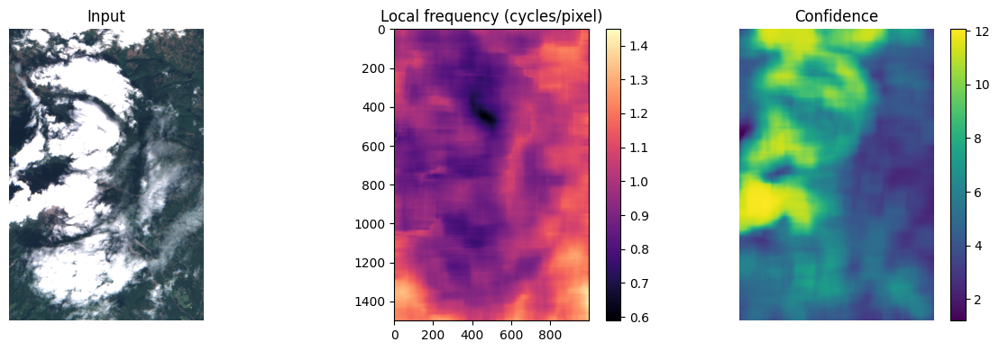

In [97]:
# L can be any single-band float image, for example a blue-red ratio or SWIR band
# Example with a grayscale array img_float in [0,1]
F, C, E1, E2 = local_frequency_map(
    scene,
    sigma_x=1.0,     # across-track derivative scale
    sigma_y=1.6,     # along-track derivative scale
    win_radius=55,    # 7x7 box for local energy
    eps=1e-6,
    blur_is_gaussian=False,
    clip_to_nyquist=False
)

# Turn F into a processing-scale map if you like
alpha = 1.0
sigma_min, sigma_max = 0.8, 6.0
sigma_proc = np.clip(alpha / (F + 1e-3), sigma_min, sigma_max)

true_color = np.clip(scene[..., [3,2,1]] * 3.5, 0, 1)  # B04,B03,B02
frequency_sum = F.sum(-1)
C_sum = C.sum(-1)

# Example visualization (matplotlib)
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.title("Input"); plt.imshow(true_color, cmap="gray"); plt.axis("off")
plt.subplot(1,3,2); plt.title("Local frequency (cycles/pixel)"); plt.imshow(frequency_sum, cmap="magma"); plt.colorbar(fraction=0.046)
plt.subplot(1,3,3); plt.title("Confidence"); plt.imshow(C_sum, cmap="viridis"); plt.colorbar(fraction=0.046); plt.axis("off")
plt.tight_layout()

In [98]:
import numpy as np
import cv2

def local_wavelength_map_autocorr(
    L,
    win_radius=5,          # 11x11 box for local stats
    eps=1e-6,
    clip_pix=(2.0, 256.0), # min and max wavelength in pixels for display
    pixel_size=None,       # meters per pixel if you want physical units
    smooth_radius=0        # optional final smoothing radius (box)
):
    """
    L            : single-band float image (np.float32 recommended)
    Returns:
      lam_pix    : wavelength map in pixels per cycle
      conf       : confidence map in [0,1] from local variance
      fx, fy     : per-axis frequencies (cycles per pixel), useful for debugging
    """
    L = np.asarray(L, np.float32)

    # remove local mean
    k = 2 * win_radius + 1
    mu = cv2.boxFilter(L, ddepth=-1, ksize=(k, k), normalize=True, borderType=cv2.BORDER_REPLICATE)
    Lz = L - mu

    # local energy denominator
    E = cv2.boxFilter(Lz * Lz, ddepth=cv2.CV_32F, ksize=(k, k), normalize=True, borderType=cv2.BORDER_REPLICATE)
    denom = E + eps

    # 1-pixel shifts with replicate borders
    shift_x = np.empty_like(Lz)
    shift_x[:, :-1] = Lz[:, 1:]
    shift_x[:, -1]  = Lz[:, -1]

    shift_y = np.empty_like(Lz)
    shift_y[:-1, :] = Lz[1:, :]
    shift_y[-1, :]  = Lz[-1, :]

    # normalized autocorrelations at lag 1
    num_x = cv2.boxFilter(Lz * shift_x, cv2.CV_32F, (k, k), normalize=True, borderType=cv2.BORDER_REPLICATE)
    num_y = cv2.boxFilter(Lz * shift_y, cv2.CV_32F, (k, k), normalize=True, borderType=cv2.BORDER_REPLICATE)
    rx = np.clip(num_x / denom, -0.9999, 0.9999)
    ry = np.clip(num_y / denom, -0.9999, 0.9999)

    # frequency per axis from r(1) = cos(omega)
    # arccos is stable, or use atan2(sin, cos) if you prefer
    omegax = np.arccos(rx)
    omegay = np.arccos(ry)
    fx = omegax / (2.0 * np.pi)    # cycles per pixel
    fy = omegay / (2.0 * np.pi)

    # isotropic frequency magnitude and wavelength
    f_mag = np.sqrt(fx * fx + fy * fy)
    f_mag = np.maximum(f_mag, 1.0 / clip_pix[1])  # avoid inf
    lam_pix = 1.0 / f_mag
    lam_pix = np.clip(lam_pix, clip_pix[0], clip_pix[1])

    # optional mild smoothing for readability
    if smooth_radius > 0:
        ks = 2 * smooth_radius + 1
        lam_pix = cv2.boxFilter(lam_pix, -1, (ks, ks), normalize=True, borderType=cv2.BORDER_REPLICATE)

    # confidence from local variance, mapped to [0,1] robustly
    conf = np.sqrt(np.maximum(E, 0.0))
    p1, p2 = np.percentile(conf, [5, 95])
    if p2 > p1:
        conf = np.clip((conf - p1) / (p2 - p1), 0.0, 1.0)
    else:
        conf[:] = 0.0

    # convert to meters if needed
    if pixel_size is not None:
        lam_m = lam_pix * float(pixel_size)
        return lam_pix.astype(np.float32), lam_m.astype(np.float32), conf.astype(np.float32), fx.astype(np.float32), fy.astype(np.float32)

    return lam_pix.astype(np.float32), conf.astype(np.float32), fx.astype(np.float32), fy.astype(np.float32)


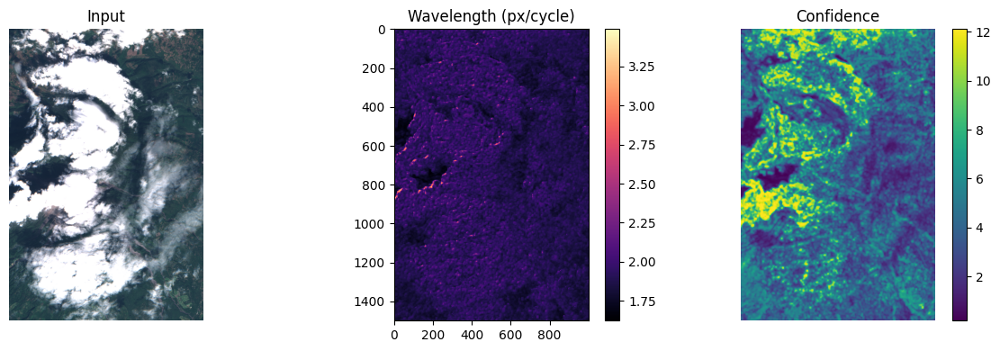

In [111]:
# L can be a blue-red ratio, a SWIR band, or any scalar feature in float
L = scene

lam_pix, conf, fx, fy = local_wavelength_map_autocorr(
    L,
    win_radius=111,          # 11x11 window
    clip_pix=(2.0, 256.0), # clamp for visualization
    pixel_size=None,       # set to 10.0 for Sentinel-2 10 m bands if you want meters
    smooth_radius=1
)

# To show meters instead
lam_pix, lam_m, conf, fx, fy = local_wavelength_map_autocorr(L, win_radius=5, pixel_size=10.0)

true_color = np.clip(scene[..., [3,2,1]] * 3.5, 0, 1)  # B04,B03,B02
frequency_sum = lam_pix.sum(-1)
C_sum = conf.sum(-1)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.title("Input"); plt.imshow(true_color, cmap="gray"); plt.axis("off")
plt.subplot(1,3,2); plt.title("Wavelength (px/cycle)"); plt.imshow(np.log10(frequency_sum), cmap="magma"); plt.colorbar(fraction=0.046)
plt.subplot(1,3,3); plt.title("Confidence"); plt.imshow(C_sum, cmap="viridis"); plt.colorbar(fraction=0.046); plt.axis("off")
plt.tight_layout()


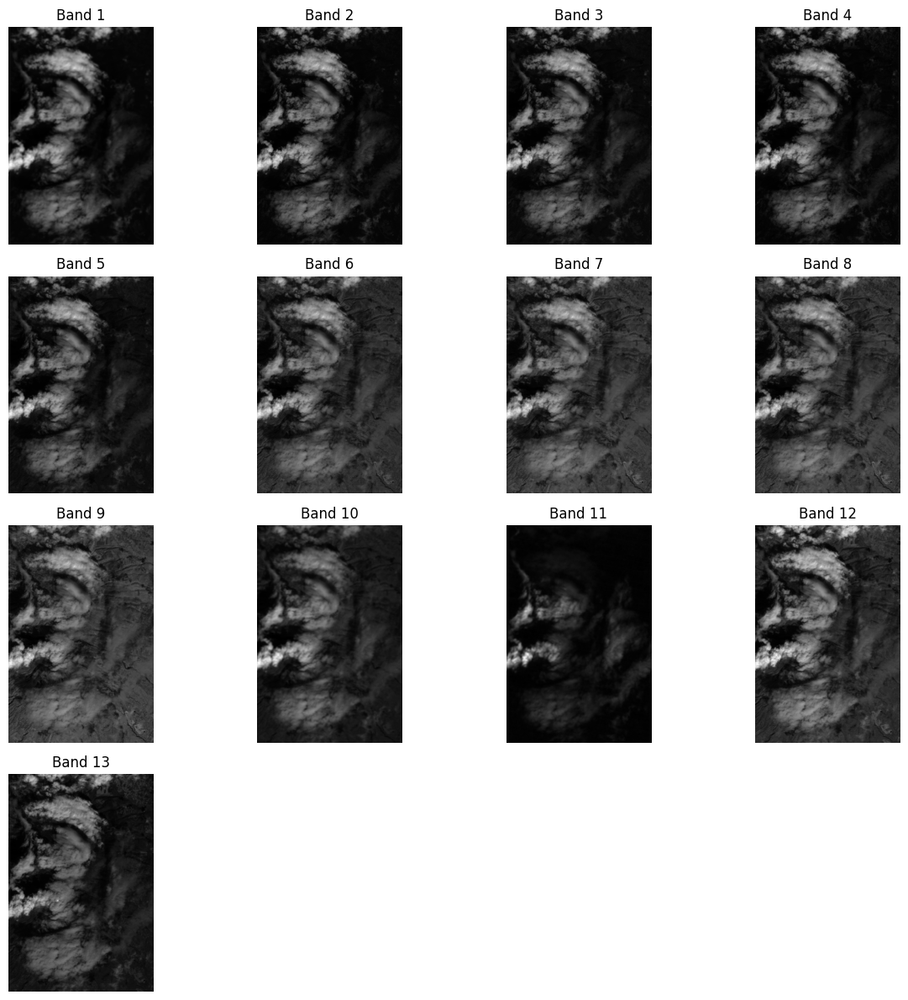

In [117]:
# show all the bands of scene in a grid
n_bands = scene.shape[-1]
n_cols = 4
n_rows = (n_bands + n_cols - 1) // n_cols

plt.figure(figsize=(12, 12))
for i in range(n_bands):
    plt.subplot(n_rows, n_cols, i + 1)
    plt.title(f"Band {i + 1}")
    plt.imshow(scene[..., i], cmap="gray")
    plt.axis("off")
plt.tight_layout()


In [118]:
import numpy as np
import cv2

def sigma_map_from_image(
    L,
    wx=5, wy=7,          # window for max/min, rectangular works well
    r_norm=3,            # radius for MAD normalization
    sigma_min=0.8,       # pixels
    sigma_max=6.0,       # pixels
    gamma=0.8,           # softness of the mapping
    smooth=1             # small box smooth on the final sigma
):
    L = np.asarray(L, np.float32)

    # separable dilation and erosion
    kx = cv2.getStructuringElement(cv2.MORPH_RECT, (wx, 1))
    ky = cv2.getStructuringElement(cv2.MORPH_RECT, (1, wy))
    max_h = cv2.dilate(L, kx, borderType=cv2.BORDER_REPLICATE)
    max_2d = cv2.dilate(max_h, ky, borderType=cv2.BORDER_REPLICATE)
    min_h = cv2.erode(L, kx, borderType=cv2.BORDER_REPLICATE)
    min_2d = cv2.erode(min_h, ky, borderType=cv2.BORDER_REPLICATE)
    M = max_2d - min_2d

    # local normalization
    k = 2 * r_norm + 1
    mu  = cv2.boxFilter(L, -1, (k, k), normalize=True, borderType=cv2.BORDER_REPLICATE)
    mad = cv2.boxFilter(np.abs(L - mu), -1, (k, k), normalize=True, borderType=cv2.BORDER_REPLICATE)
    score = M / (mad + 1e-6)

    # robust stretch to [0,1]
    p1, p2 = np.percentile(score, [5, 95])
    D = np.clip((score - p1) / max(p2 - p1, 1e-6), 0.0, 1.0)

    # sigma from D
    sigma = sigma_min + (1.0 - D)**gamma * (sigma_max - sigma_min)

    if smooth > 0:
        ks = 2 * smooth + 1
        sigma = cv2.boxFilter(sigma, -1, (ks, ks), normalize=True, borderType=cv2.BORDER_REPLICATE)

    return sigma.astype(np.float32), D.astype(np.float32), M.astype(np.float32)


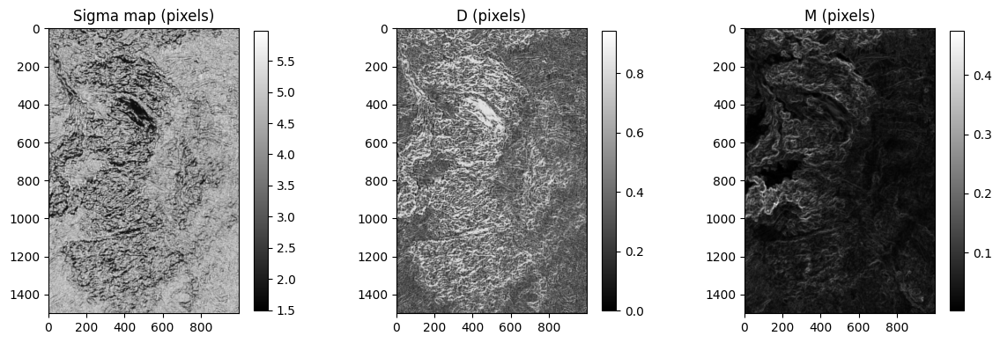

In [120]:
sigma_map, D, M = sigma_map_from_image(scene)

# show sigma_map, D, M
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.title("Sigma map (pixels)"); plt.imshow(sigma_map.mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.subplot(1,3,2); plt.title("D (pixels)"); plt.imshow(D.mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.subplot(1,3,3); plt.title("M (pixels)"); plt.imshow(M.mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.tight_layout()

In [121]:
import numpy as np
import cv2

def sigma_from_edge_distance(
    L,                      # single band, float32
    sigma_d=1.5,            # derivative blur (px)
    sigma_i=2.5,            # tensor integration blur (px)
    edge_percentile=85,     # keep top X% as edges
    sigma_min=0.8,          # px
    sigma_max=6.0,          # px
    dmax=50,                # cap distance in px
    thin=True
):
    L = np.asarray(L, np.float32)

    # 1) Gradients with one derivative scale
    k = int(np.ceil(3*sigma_d))*2 + 1
    Ls = cv2.GaussianBlur(L, (k, k), sigma_d, sigma_d, borderType=cv2.BORDER_REPLICATE)
    Ix = cv2.Sobel(Ls, cv2.CV_32F, 1, 0, ksize=3, borderType=cv2.BORDER_REPLICATE)
    Iy = cv2.Sobel(Ls, cv2.CV_32F, 0, 1, ksize=3, borderType=cv2.BORDER_REPLICATE)
    G = np.sqrt(Ix*Ix + Iy*Iy)

    # 2) Structure tensor and coherence (edges = strong, oriented change)
    k2 = int(np.ceil(3*sigma_i))*2 + 1
    Jxx = cv2.GaussianBlur(Ix*Ix, (k2, k2), sigma_i, sigma_i, borderType=cv2.BORDER_REPLICATE)
    Jxy = cv2.GaussianBlur(Ix*Iy, (k2, k2), sigma_i, sigma_i, borderType=cv2.BORDER_REPLICATE)
    Jyy = cv2.GaussianBlur(Iy*Iy, (k2, k2), sigma_i, sigma_i, borderType=cv2.BORDER_REPLICATE)

    tr  = Jxx + Jyy
    det = Jxx*Jyy - Jxy*Jxy
    disc = np.sqrt(np.maximum(tr*tr - 4.0*det, 0.0))
    lam1 = 0.5*(tr + disc)
    lam2 = 0.5*(tr - disc)
    coherence = (lam1 - lam2) / (lam1 + lam2 + 1e-6)

    edge_score = coherence * G

    # 3) Thin, clean, and binarize edges
    t = np.percentile(edge_score, edge_percentile)
    edges = (edge_score >= t).astype(np.uint8) * 255
    if thin:
        edges = cv2.morphologyEx(edges, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
        edges = cv2.Canny((edge_score / (edge_score.max()+1e-6)*255).astype(np.uint8), 50, 150)

    # 4) Distance to nearest edge (pixels)
    inv = 255 - edges
    dist = cv2.distanceTransform(inv, cv2.DIST_L2, 3)
    dist = np.clip(dist, 0.0, float(dmax))

    # 5) Map distance to sigma
    sigma = sigma_min + (dist / dmax) * (sigma_max - sigma_min)

    return sigma.astype(np.float32), edges, coherence.astype(np.float32), G.astype(np.float32)


In [124]:
sigma_map.shape

(1500, 1000)

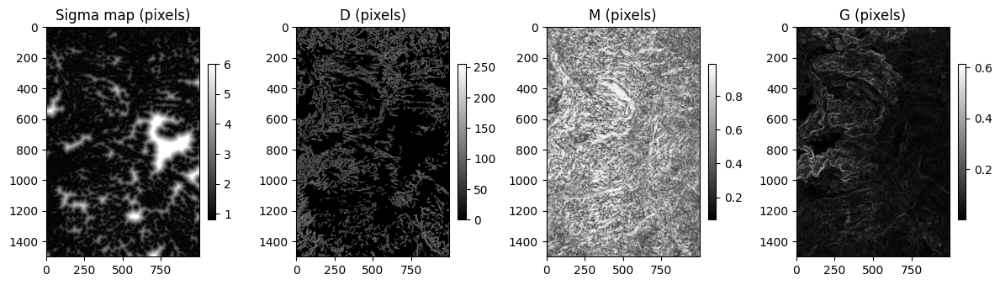

In [128]:
sigma_map, D, M, G = sigma_from_edge_distance(scene)

# show sigma_map, D, M
plt.figure(figsize=(12,4))
plt.subplot(1,4,1); plt.title("Sigma map (pixels)"); plt.imshow(sigma_map, cmap="gray"); plt.colorbar(fraction=0.046)
plt.subplot(1,4,2); plt.title("D (pixels)"); plt.imshow(D, cmap="gray"); plt.colorbar(fraction=0.046)
plt.subplot(1,4,3); plt.title("M (pixels)"); plt.imshow(M.mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.subplot(1,4,4); plt.title("G (pixels)"); plt.imshow(G.mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.tight_layout()

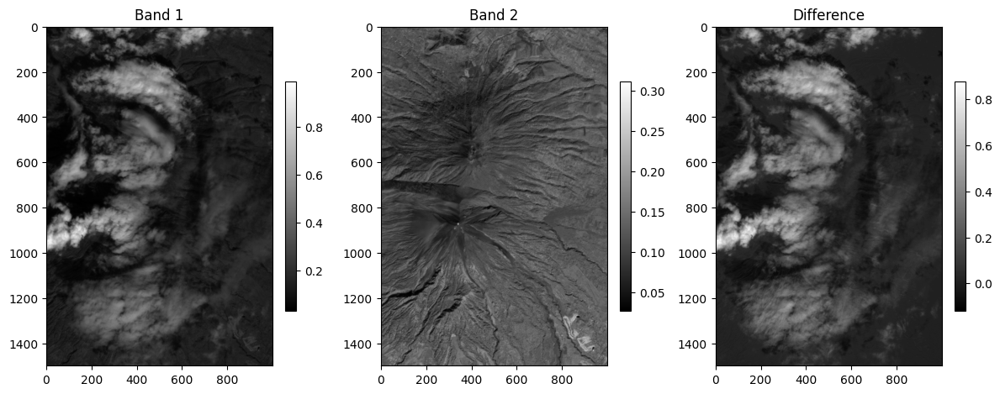

In [143]:
diff = bands[0] - bands[1]

# image grid of bands[0], bands[1] and diff
plt.figure(figsize=(12,6))
plt.subplot(1,3,1); plt.title("Band 1"); plt.imshow(bands[0].mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.subplot(1,3,2); plt.title("Band 2"); plt.imshow(bands[1].mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.subplot(1,3,3); plt.title("Difference"); plt.imshow(diff.mean(-1), cmap="gray"); plt.colorbar(fraction=0.046)
plt.tight_layout()